In [1]:
import pandas as pd
import numpy as np
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import nltk
nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\ephre\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [2]:
import sys
sys.path.append(r'C:\Users\ephre\Documents\Financial News and Stock Price Integration\Scripts')
from correlation import Correlation

In [3]:
file_paths = {
    'df': r'C:\Users\ephre\Documents\Financial News and Stock Price Integration\data\raw_analyst_ratings\raw_analyst_ratings.csv',
    'AAPL': r'C:\Users\ephre\Documents\Financial News and Stock Price Integration\data\yfinance_data\AAPL_historical_data.csv',
    'AMZN': r'C:\Users\ephre\Documents\Financial News and Stock Price Integration\data\yfinance_data\AMZN_historical_data.csv',
    'GOOG': r'C:\Users\ephre\Documents\Financial News and Stock Price Integration\data\yfinance_data\GOOG_historical_data.csv',
    'META': r'C:\Users\ephre\Documents\Financial News and Stock Price Integration\data\yfinance_data\META_historical_data.csv',
    'MSFT': r'C:\Users\ephre\Documents\Financial News and Stock Price Integration\data\yfinance_data\MSFT_historical_data.csv',
    'NVDA': r'C:\Users\ephre\Documents\Financial News and Stock Price Integration\data\yfinance_data\NVDA_historical_data.csv',
    'TSLA': r'C:\Users\ephre\Documents\Financial News and Stock Price Integration\data\yfinance_data\NVDA_historical_data.csv'
}

## AAPL

In [4]:
co = Correlation(file_paths)

In [5]:
df_AAPL = co.read_csv_with_date(filepath=file_paths['AAPL'], date_col='Date')

In [6]:
co.check_nulls_and_info(df_AAPL, 'AAPL Data')

Total null values in AAPL Data: 0

AAPL Data Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10998 entries, 0 to 10997
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Date          10998 non-null  datetime64[ns]
 1   Open          10998 non-null  float64       
 2   High          10998 non-null  float64       
 3   Low           10998 non-null  float64       
 4   Close         10998 non-null  float64       
 5   Adj Close     10998 non-null  float64       
 6   Volume        10998 non-null  int64         
 7   Dividends     10998 non-null  float64       
 8   Stock Splits  10998 non-null  float64       
dtypes: datetime64[ns](1), float64(7), int64(1)
memory usage: 773.4 KB
None




In [7]:
df_AAPL = co.convert_to_datetime(df_AAPL, date_col='Date')
df_AAPL.head(3)

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
0,1980-12-12 00:00:00+00:00,0.128348,0.128906,0.128348,0.128348,0.098943,469033600,0.0,0.0
1,1980-12-15 00:00:00+00:00,0.122210,0.122210,0.121652,0.121652,0.093781,175884800,0.0,0.0
2,1980-12-16 00:00:00+00:00,0.113281,0.113281,0.112723,0.112723,0.086898,105728000,0.0,0.0


In [8]:
df_AAPL = co.format_date_column(df_AAPL, date_col='Date')
df_AAPL.head(3)

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
0,1980-12-12,0.128348,0.128906,0.128348,0.128348,0.098943,469033600,0.0,0.0
1,1980-12-15,0.122210,0.122210,0.121652,0.121652,0.093781,175884800,0.0,0.0
2,1980-12-16,0.113281,0.113281,0.112723,0.112723,0.086898,105728000,0.0,0.0


## sentiment

In [9]:
df_raw = co.read_csv_with_date(filepath=file_paths['df'], date_col='date')
df_raw.sample(3)

,Unnamed: 0,headline,url,publisher,date,stock
306145,307878,UPDATE: Castlight Health Names John Doyle CEO ...,https://www.benzinga.com/news/management/17/01...,Paul Quintaro,2017-01-04 00:00:00,CSLT
245826,247348,Civitas Solutions Reports Q1 EPS from Continui...,https://www.benzinga.com/news/earnings/17/02/9...,Paul Quintaro,2017-02-09 00:00:00,CIVI
1033649,1038751,42 Stocks Moving In Thursday's Mid-Day Session,https://www.benzinga.com/news/20/05/16034782/4...,Lisa Levin,2020-05-14 12:55:17-04:00,PSTI


In [10]:
sentiment_data = co.analyze_sentiment(df_raw)

In [11]:
sentiment_data['date'] = pd.to_datetime(sentiment_data['date'], format='mixed', utc=True)
sentiment_data['date'] = sentiment_data['date'].dt.strftime('%Y-%m-%d')
sentiment_data.set_index('date', inplace=True)
sentiment_data

,Unnamed: 0,headline,url,publisher,stock,sentiment,sentiment_category
date,,,,,,,
2020-06-05,0,Stocks That Hit 52-Week Highs On Friday,https://www.benzinga.com/news/20/06/16190091/s...,Benzinga Insights,A,0.0000,Neutral
2020-06-03,1,Stocks That Hit 52-Week Highs On Wednesday,https://www.benzinga.com/news/20/06/16170189/s...,Benzinga Insights,A,0.0000,Neutral
2020-05-26,2,71 Biggest Movers From Friday,https://www.benzinga.com/news/20/05/16103463/7...,Lisa Levin,A,0.0000,Neutral
2020-05-22,3,46 Stocks Moving In Friday's Mid-Day Session,https://www.benzinga.com/news/20/05/16095921/4...,Lisa Levin,A,0.0000,Neutral
2020-05-22,4,B of A Securities Maintains Neutral on Agilent...,https://www.benzinga.com/news/20/05/16095304/b...,Vick Meyer,A,0.2960,Positive
...,...,...,...,...,...,...,...
2011-08-29,1413844,Top Narrow Based Indexes For August 29,https://www.benzinga.com/news/11/08/1888782/to...,Monica Gerson,ZX,0.2023,Positive
2011-06-22,1413845,Recap: Wednesday's Top Percentage Gainers and ...,https://www.benzinga.com/news/earnings/11/06/1...,Benjamin Lee,ZX,-0.3818,Negative
2011-06-21,1413846,UPDATE: Oppenheimer Color on China Zenix Auto ...,https://www.benzinga.com/analyst-ratings/analy...,BenzingaStaffL,ZX,0.0000,Neutral


In [12]:
df_AAPL.rename(columns={"Date": "date"}, inplace=True)
df_AAPL.set_index('date', inplace=True)
df_AAPL.sample(5)

,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
date,,,,,,,,
1983-08-02,0.154018,0.156250,0.152902,0.153460,0.118302,101651200,0.0,0.0
2005-02-23,1.548571,1.579464,1.527679,1.575536,1.330501,1345181600,0.0,0.0
1999-08-27,0.560268,0.580357,0.559710,0.578125,0.488212,446835200,0.0,0.0
1981-01-21,0.145089,0.146205,0.145089,0.145089,0.111849,15904000,0.0,0.0
2021-11-29,159.369995,161.190002,158.789993,160.240005,157.830902,88748200,0.0,0.0


In [13]:
df_AAPL = co.calculate_daily_returns(df_AAPL)

In [14]:
aligned_date_AAPL = co.merge_dataframes(df_AAPL, sentiment_data)


In [15]:
daily_sentiment_AAPL = co.aggregate_daily_sentiment(aligned_date_AAPL)


Correlation between sentiment and daily stock returns: 0.0476474665370319


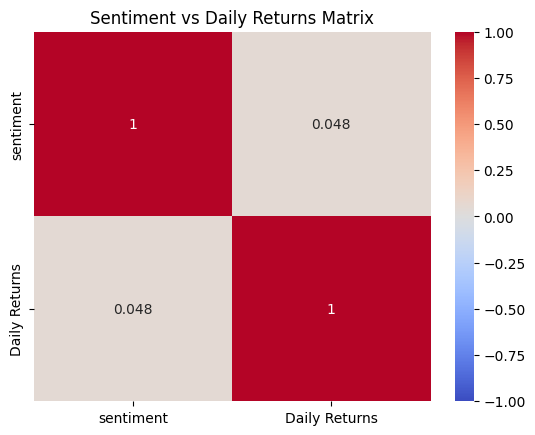

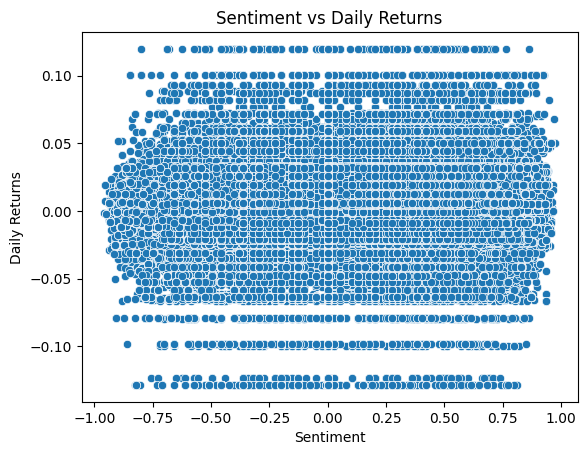

In [16]:
co.analyze_correlation_and_plot(aligned_date_AAPL)

Correlation between sentiment and daily stock returns: -0.009085390093111663


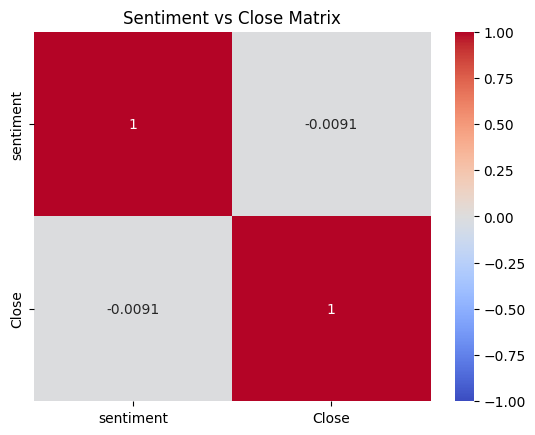

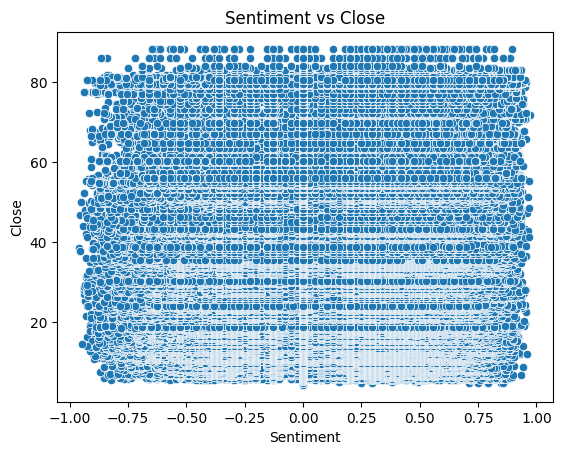

In [17]:
co.analyze_correlation_and_plot(aligned_date_AAPL, returns_col='Close')

Correlation between sentiment and daily stock returns: -0.009810672821413962


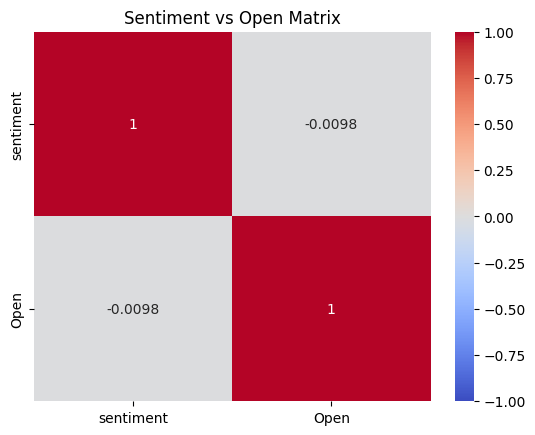

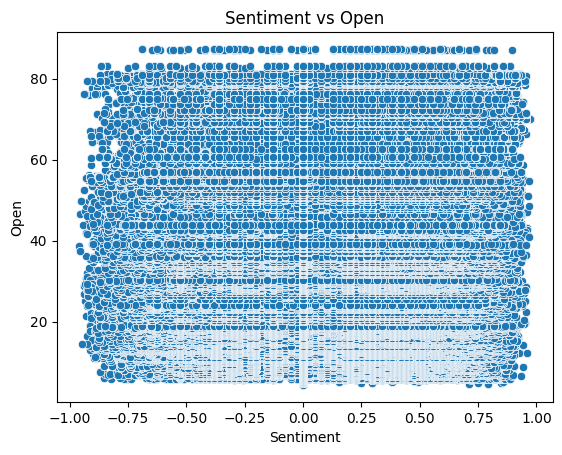

In [18]:
co.analyze_correlation_and_plot(aligned_date_AAPL, returns_col='Open')

Correlation between sentiment and daily stock returns: -0.010520986579385152


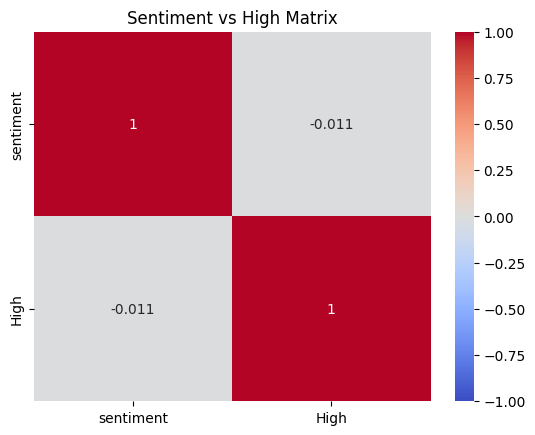

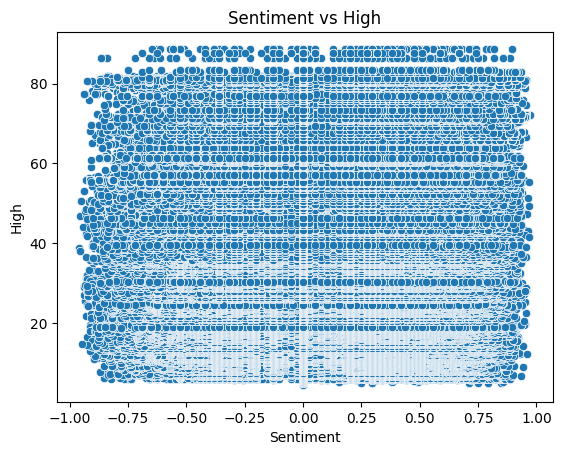

In [19]:
co.analyze_correlation_and_plot(aligned_date_AAPL, returns_col='High')

Correlation between sentiment and daily stock returns: -0.008876766026884952


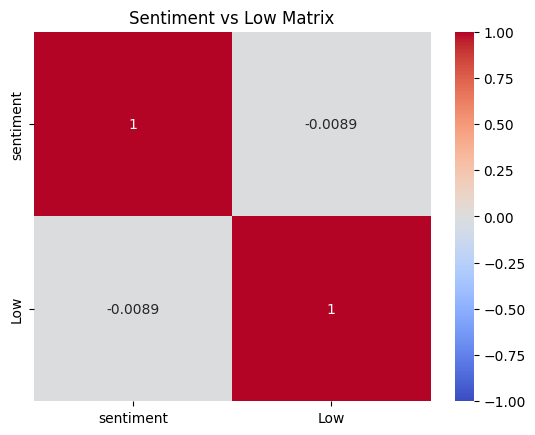

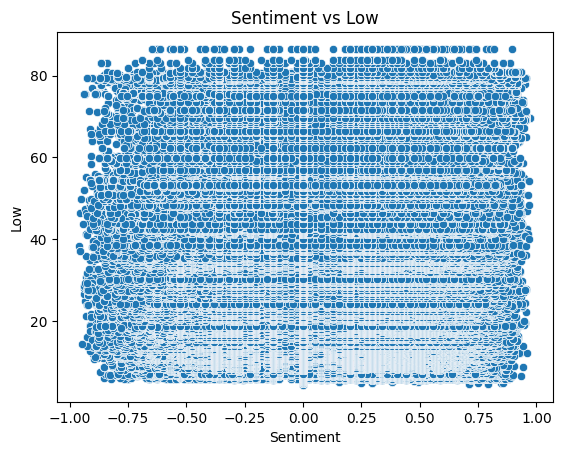

In [20]:
co.analyze_correlation_and_plot(aligned_date_AAPL, returns_col='Low')

Correlation between sentiment and daily stock returns: -0.009215807925297078


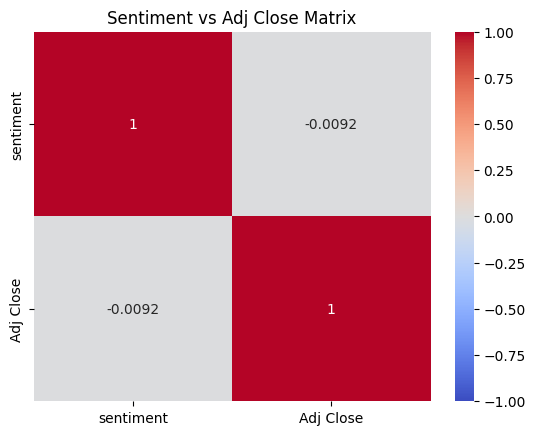

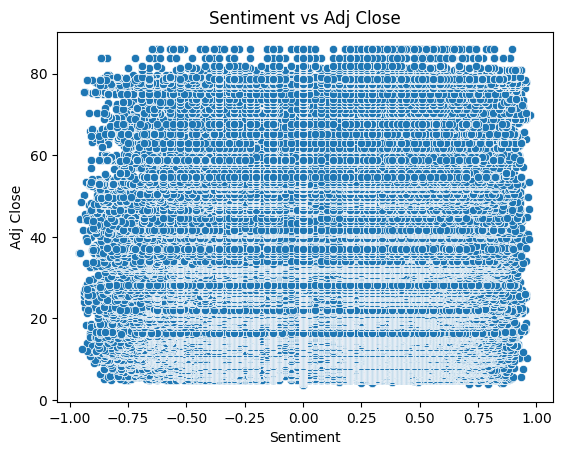

In [21]:
co.analyze_correlation_and_plot(aligned_date_AAPL, returns_col='Adj Close')

## AMZN

In [22]:
df_AMZN = co.read_csv_with_date(filepath=file_paths['AMZN'], date_col='Date')

In [23]:
co.check_nulls_and_info(df_AMZN, 'AMZN Data')

Total null values in AMZN Data: 0

AMZN Data Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6846 entries, 0 to 6845
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Date          6846 non-null   datetime64[ns]
 1   Open          6846 non-null   float64       
 2   High          6846 non-null   float64       
 3   Low           6846 non-null   float64       
 4   Close         6846 non-null   float64       
 5   Adj Close     6846 non-null   float64       
 6   Volume        6846 non-null   int64         
 7   Dividends     6846 non-null   float64       
 8   Stock Splits  6846 non-null   float64       
dtypes: datetime64[ns](1), float64(7), int64(1)
memory usage: 481.5 KB
None




In [24]:
df_AMZN = co.convert_to_datetime(df_AMZN, date_col='Date')
df_AMZN.head(3)

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
0,1997-05-15 00:00:00+00:00,0.121875,0.125000,0.096354,0.097917,0.097917,1443120000,0.0,0.0
1,1997-05-16 00:00:00+00:00,0.098438,0.098958,0.085417,0.086458,0.086458,294000000,0.0,0.0
2,1997-05-19 00:00:00+00:00,0.088021,0.088542,0.081250,0.085417,0.085417,122136000,0.0,0.0


In [25]:
df_AMZN = co.format_date_column(df_AMZN, date_col='Date')
df_AMZN.head(3)

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
0,1997-05-15,0.121875,0.125000,0.096354,0.097917,0.097917,1443120000,0.0,0.0
1,1997-05-16,0.098438,0.098958,0.085417,0.086458,0.086458,294000000,0.0,0.0
2,1997-05-19,0.088021,0.088542,0.081250,0.085417,0.085417,122136000,0.0,0.0


In [26]:
df_AMZN.rename(columns={"Date": "date"}, inplace=True)
df_AMZN.set_index('date', inplace=True)
df_AMZN.sample(5)

,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
date,,,,,,,,
2000-09-07,2.340625,2.350000,2.150000,2.175000,2.175000,148124000,0.0,0.0
2012-03-28,10.307000,10.350000,10.015500,10.058000,10.058000,124900000,0.0,0.0
2013-06-04,13.350000,13.444000,13.151000,13.285000,13.285000,41772000,0.0,0.0
2014-02-18,17.764000,17.786501,17.472500,17.682501,17.682501,99960000,0.0,0.0
2017-12-19,59.457500,59.648499,58.957001,59.368999,59.368999,51756000,0.0,0.0


In [27]:
df_AMZN = co.calculate_daily_returns(df_AMZN)

In [28]:
aligned_date_AMZN = co.merge_dataframes(df_AMZN, sentiment_data)

In [29]:
daily_sentiment_AMZN = co.aggregate_daily_sentiment(aligned_date_AMZN)

Correlation between sentiment and daily stock returns: -0.01023059951615058


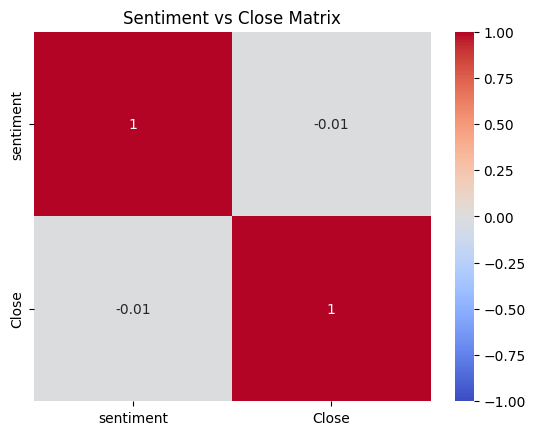

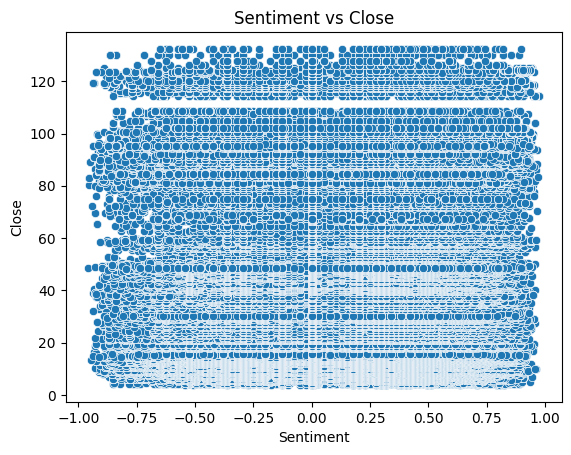

In [30]:
co.analyze_correlation_and_plot(aligned_date_AMZN, returns_col='Close')

Correlation between sentiment and daily stock returns: -0.010675950761419679


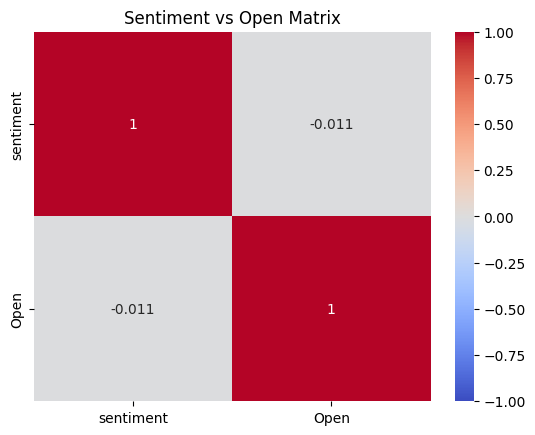

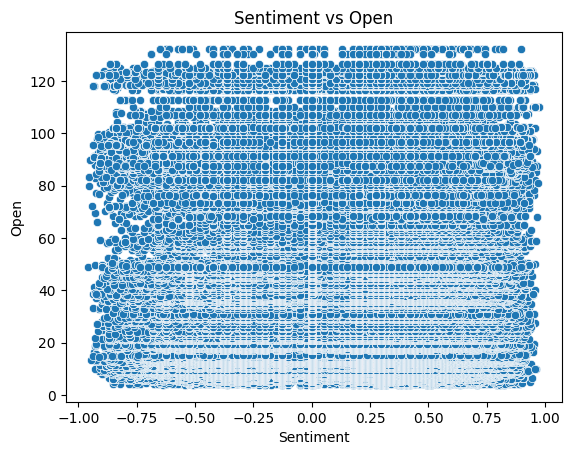

In [31]:
co.analyze_correlation_and_plot(aligned_date_AMZN, returns_col='Open')

Correlation between sentiment and daily stock returns: -0.011205730792012925


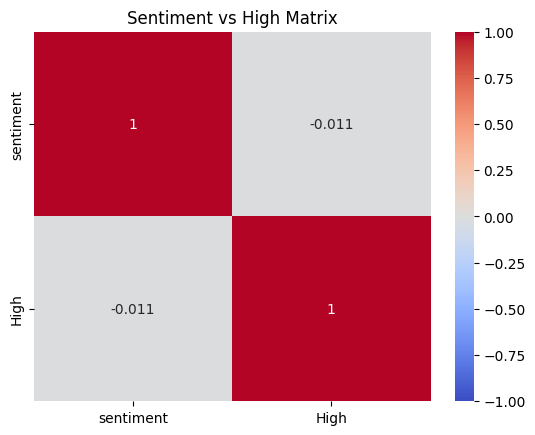

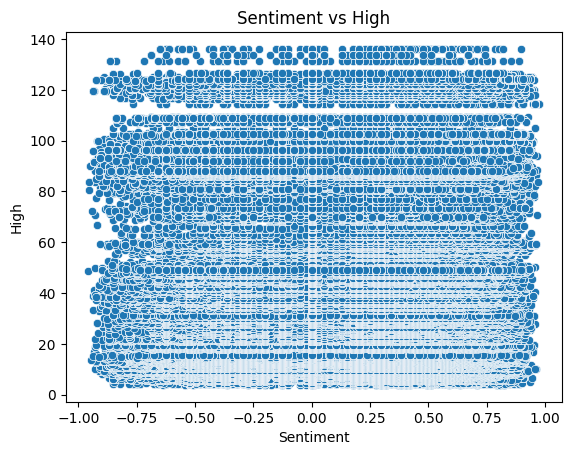

In [32]:
co.analyze_correlation_and_plot(aligned_date_AMZN, returns_col='High')

Correlation between sentiment and daily stock returns: -0.009967447886786064


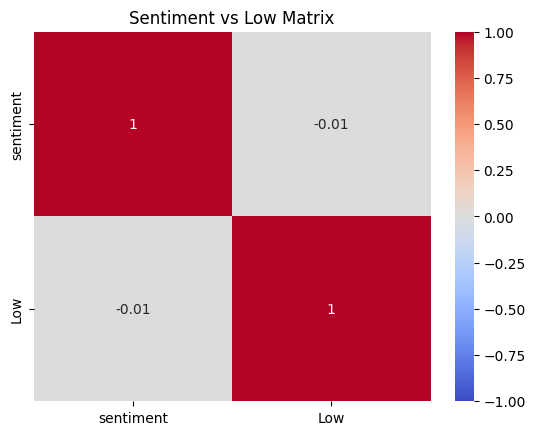

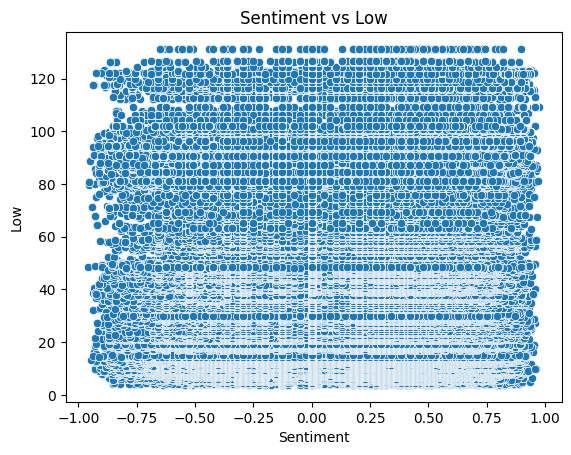

In [33]:
co.analyze_correlation_and_plot(aligned_date_AMZN, returns_col='Low')

Correlation between sentiment and daily stock returns: -0.01023059951615058


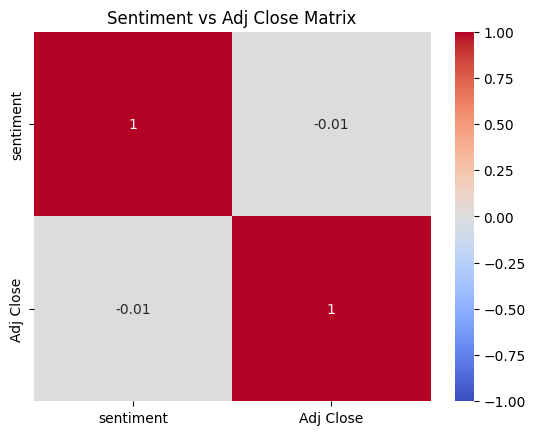

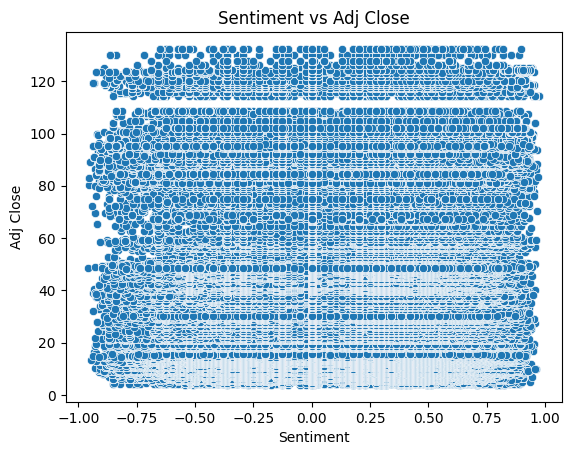

In [34]:
co.analyze_correlation_and_plot(aligned_date_AMZN, returns_col='Adj Close')

## GOOG

In [35]:
df_GOOG = co.read_csv_with_date(filepath=file_paths['GOOG'], date_col='Date')

In [36]:
co.check_nulls_and_info(df_GOOG, 'GOOG Data')

Total null values in GOOG Data: 0

GOOG Data Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5020 entries, 0 to 5019
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Date          5020 non-null   datetime64[ns]
 1   Open          5020 non-null   float64       
 2   High          5020 non-null   float64       
 3   Low           5020 non-null   float64       
 4   Close         5020 non-null   float64       
 5   Adj Close     5020 non-null   float64       
 6   Volume        5020 non-null   int64         
 7   Dividends     5020 non-null   float64       
 8   Stock Splits  5020 non-null   float64       
dtypes: datetime64[ns](1), float64(7), int64(1)
memory usage: 353.1 KB
None




In [37]:
df_GOOG = co.convert_to_datetime(df_GOOG, date_col='Date')
df_GOOG.head(3)

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
0,2004-08-19 00:00:00+00:00,2.490664,2.591785,2.390042,2.499133,2.496292,897427216,0.0,0.0
1,2004-08-20 00:00:00+00:00,2.515820,2.716817,2.503118,2.697639,2.694573,458857488,0.0,0.0
2,2004-08-23 00:00:00+00:00,2.758411,2.826406,2.716070,2.724787,2.721690,366857939,0.0,0.0


In [38]:
df_GOOG = co.format_date_column(df_GOOG, date_col='Date')
df_GOOG.head(3)

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
0,2004-08-19,2.490664,2.591785,2.390042,2.499133,2.496292,897427216,0.0,0.0
1,2004-08-20,2.515820,2.716817,2.503118,2.697639,2.694573,458857488,0.0,0.0
2,2004-08-23,2.758411,2.826406,2.716070,2.724787,2.721690,366857939,0.0,0.0


In [39]:
df_GOOG.rename(columns={"Date": "date"}, inplace=True)
df_GOOG.set_index('date', inplace=True)
df_GOOG.sample(5)

,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
date,,,,,,,,
2013-08-26,21.668779,21.790823,21.570398,21.578867,21.554338,42257801,0.0,0.0
2010-07-06,11.058550,11.149957,10.800268,10.861040,10.848695,102787835,0.0,0.0
2018-12-26,49.450500,52.000000,49.150002,51.973000,51.913925,47466000,0.0,0.0
2021-06-08,123.995003,124.724747,123.412003,124.142502,124.001396,25060000,0.0,0.0
2022-06-27,118.934998,119.250000,116.000748,116.622498,116.489937,32840000,0.0,0.0


In [40]:
df_GOOG = co.calculate_daily_returns(df_GOOG)

In [41]:
aligned_date_GOOG = co.merge_dataframes(df_GOOG, sentiment_data)

In [42]:
daily_sentiment_GOOG = co.aggregate_daily_sentiment(aligned_date_GOOG)

Correlation between sentiment and daily stock returns: -0.0009790138295978675


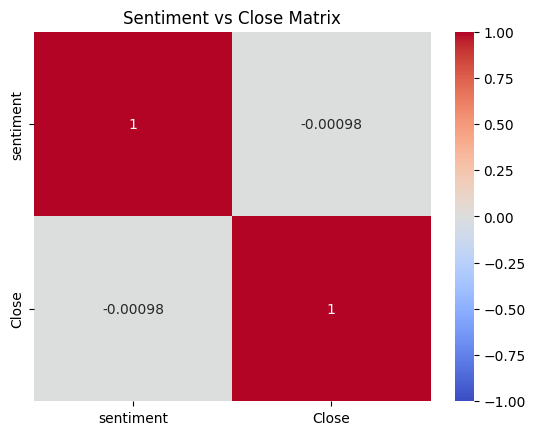

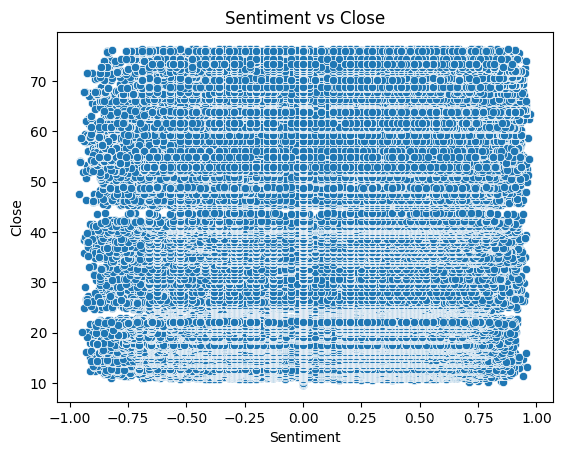

In [43]:
co.analyze_correlation_and_plot(aligned_date_GOOG, returns_col='Close')

Correlation between sentiment and daily stock returns: -0.0015081682746107515


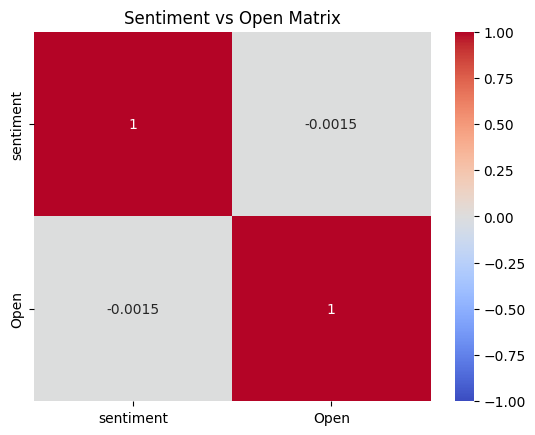

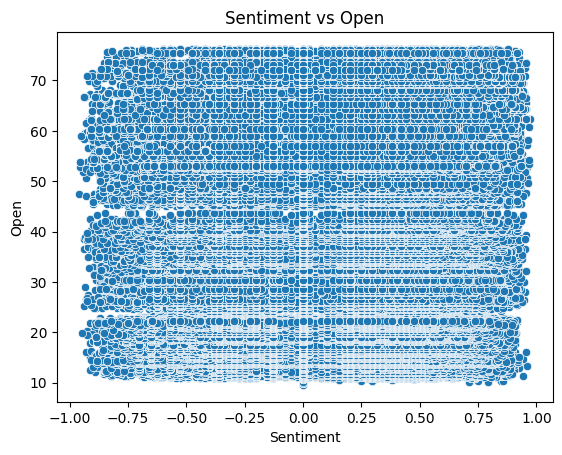

In [44]:
co.analyze_correlation_and_plot(aligned_date_GOOG, returns_col='Open')

Correlation between sentiment and daily stock returns: -0.002126311645496954


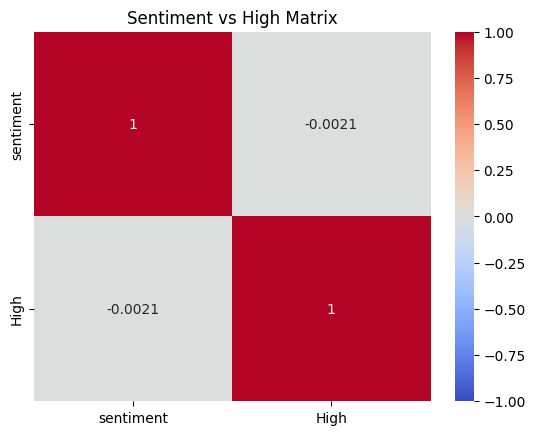

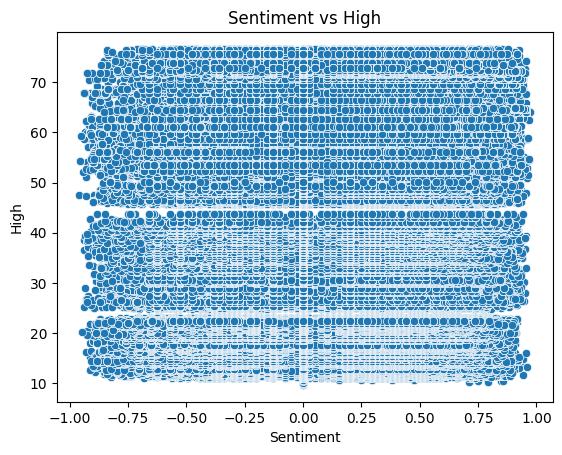

In [45]:
co.analyze_correlation_and_plot(aligned_date_GOOG, returns_col='High')

Correlation between sentiment and daily stock returns: -0.0006464836800987622


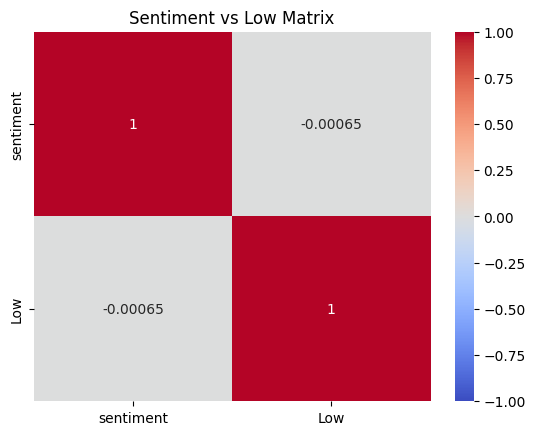

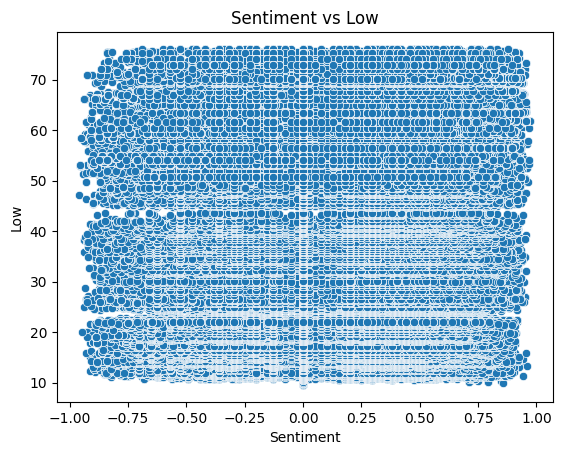

In [46]:
co.analyze_correlation_and_plot(aligned_date_GOOG, returns_col='Low')

Correlation between sentiment and daily stock returns: -0.0009790140209438368


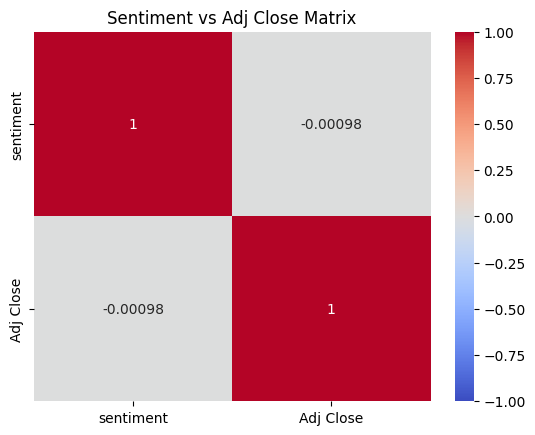

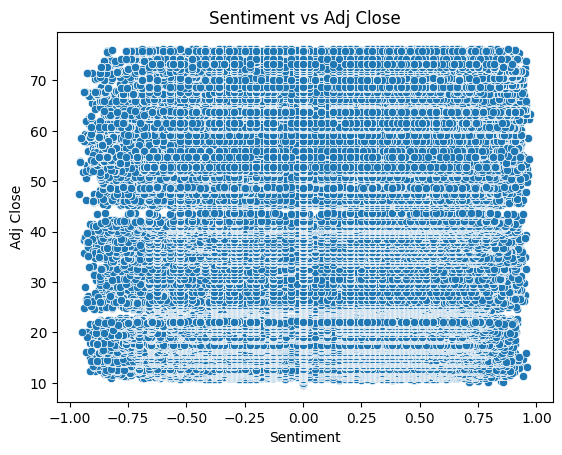

In [47]:
co.analyze_correlation_and_plot(aligned_date_GOOG, returns_col='Adj Close')

## META

In [48]:
df_META = co.read_csv_with_date(filepath=file_paths['META'], date_col='Date')

In [49]:
co.check_nulls_and_info(df_META, 'META Data')

Total null values in META Data: 0

META Data Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2926 entries, 0 to 2925
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Date          2926 non-null   datetime64[ns]
 1   Open          2926 non-null   float64       
 2   High          2926 non-null   float64       
 3   Low           2926 non-null   float64       
 4   Close         2926 non-null   float64       
 5   Adj Close     2926 non-null   float64       
 6   Volume        2926 non-null   int64         
 7   Dividends     2926 non-null   float64       
 8   Stock Splits  2926 non-null   float64       
dtypes: datetime64[ns](1), float64(7), int64(1)
memory usage: 205.9 KB
None




In [50]:
df_META = co.convert_to_datetime(df_META, date_col='Date')
df_META.head(3)

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
0,2012-12-12 00:00:00+00:00,28.00,28.139999,27.370001,27.580000,27.523441,46704200,0.0,0.0
1,2012-12-13 00:00:00+00:00,27.59,28.750000,27.430000,28.240000,28.182087,81051600,0.0,0.0
2,2012-12-14 00:00:00+00:00,28.18,28.330000,26.760000,26.809999,26.755020,91631600,0.0,0.0


In [51]:
df_META = co.format_date_column(df_META, date_col='Date')
df_META.head(3)

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
0,2012-12-12,28.00,28.139999,27.370001,27.580000,27.523441,46704200,0.0,0.0
1,2012-12-13,27.59,28.750000,27.430000,28.240000,28.182087,81051600,0.0,0.0
2,2012-12-14,28.18,28.330000,26.760000,26.809999,26.755020,91631600,0.0,0.0


In [52]:
df_META.rename(columns={"Date": "date"}, inplace=True)
df_META.set_index('date', inplace=True)
df_META.sample(5)

,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
date,,,,,,,,
2023-09-07,298.000000,307.049988,292.220001,298.670013,298.057526,33748700,0.0,0.0
2023-04-24,213.679993,213.919998,210.710007,212.789993,212.353622,15750900,0.0,0.0
2016-06-28,110.629997,112.750000,110.550003,112.699997,112.468880,26813800,0.0,0.0
2015-07-01,86.769997,87.949997,86.489998,86.910004,86.731773,25260000,0.0,0.0
2018-04-18,166.880005,168.119995,165.770004,166.360001,166.018845,20969600,0.0,0.0


In [53]:
df_META = co.calculate_daily_returns(df_META)

In [54]:
aligned_date_META = co.merge_dataframes(df_META, sentiment_data)

In [55]:
daily_sentiment_META = co.aggregate_daily_sentiment(aligned_date_META)

Correlation between sentiment and daily stock returns: -0.005172797521417932


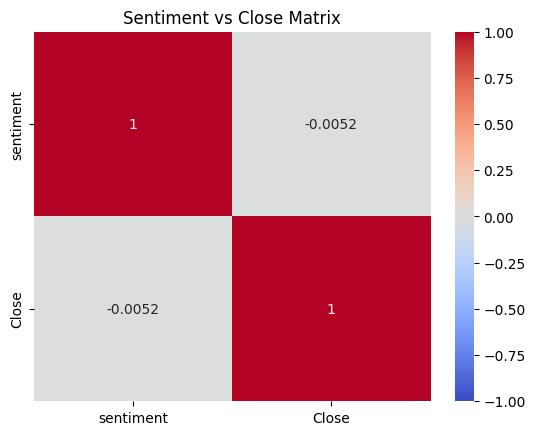

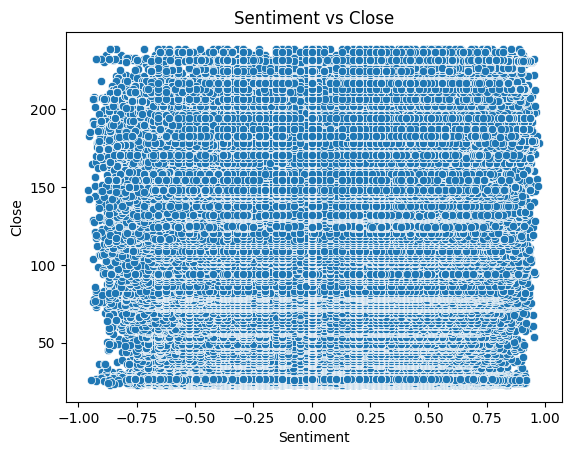

In [56]:
co.analyze_correlation_and_plot(aligned_date_META, returns_col='Close')

Correlation between sentiment and daily stock returns: -0.005922857870672321


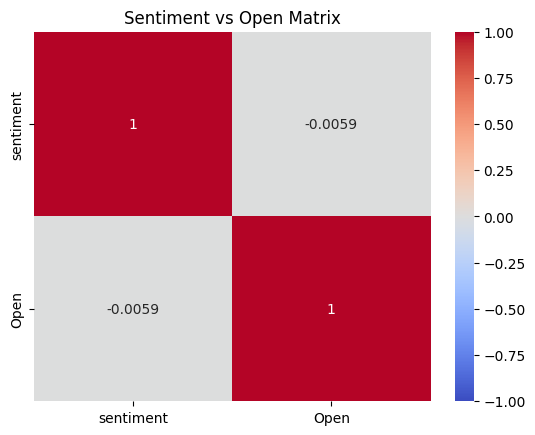

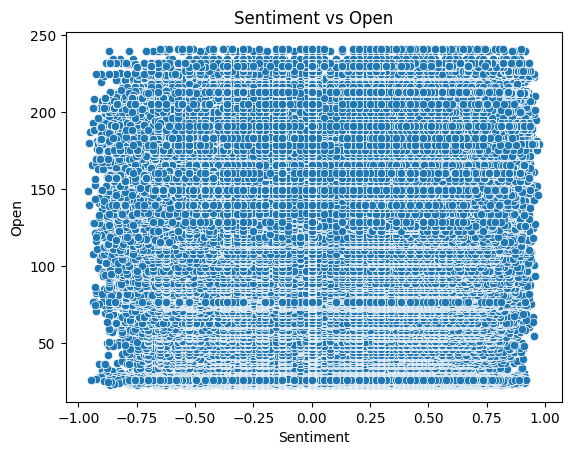

In [57]:
co.analyze_correlation_and_plot(aligned_date_META, returns_col='Open')

Correlation between sentiment and daily stock returns: -0.006745204390481038


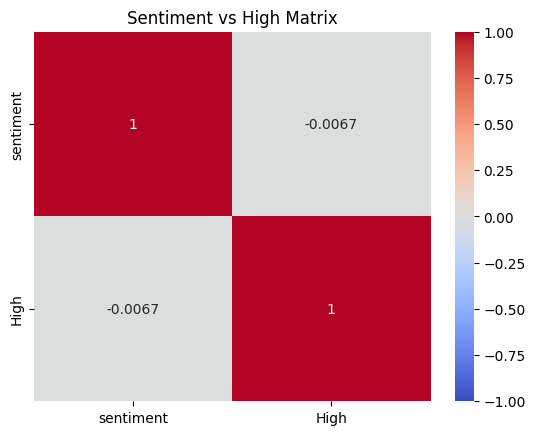

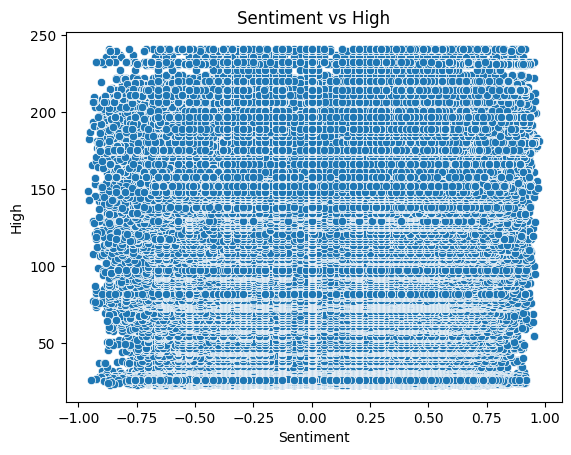

In [58]:
co.analyze_correlation_and_plot(aligned_date_META, returns_col='High')

Correlation between sentiment and daily stock returns: -0.004854356378916325


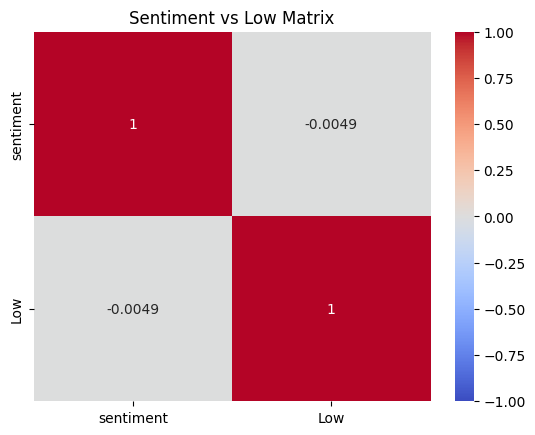

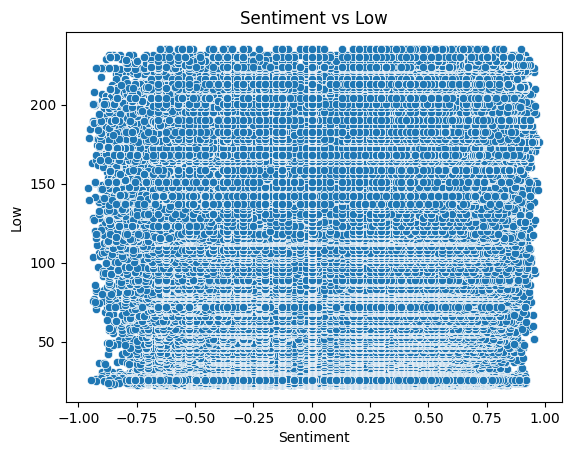

In [59]:
co.analyze_correlation_and_plot(aligned_date_META, returns_col='Low')

Correlation between sentiment and daily stock returns: -0.00517279828831092


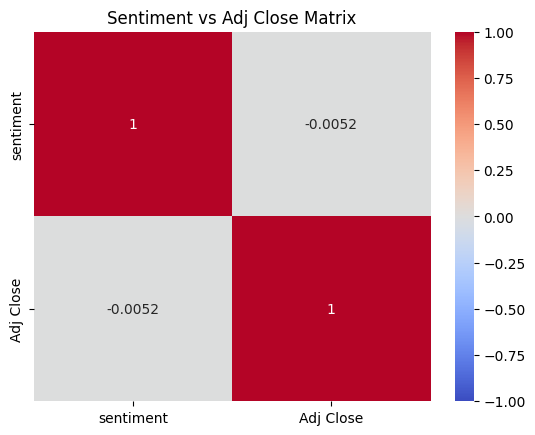

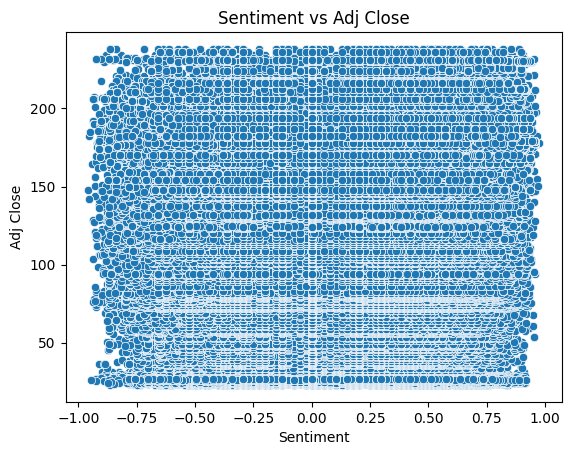

In [60]:
co.analyze_correlation_and_plot(aligned_date_META, returns_col='Adj Close')

## MSFT

In [61]:
df_MSFT = co.read_csv_with_date(filepath=file_paths['MSFT'], date_col='Date')

In [62]:
co.check_nulls_and_info(df_MSFT, 'MSFT Data')

Total null values in MSFT Data: 0

MSFT Data Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9672 entries, 0 to 9671
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Date          9672 non-null   datetime64[ns]
 1   Open          9672 non-null   float64       
 2   High          9672 non-null   float64       
 3   Low           9672 non-null   float64       
 4   Close         9672 non-null   float64       
 5   Adj Close     9672 non-null   float64       
 6   Volume        9672 non-null   int64         
 7   Dividends     9672 non-null   float64       
 8   Stock Splits  9672 non-null   float64       
dtypes: datetime64[ns](1), float64(7), int64(1)
memory usage: 680.2 KB
None




In [63]:
df_MSFT = co.convert_to_datetime(df_MSFT, date_col='Date')
df_MSFT.head(3)

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
0,1986-03-13 00:00:00+00:00,0.088542,0.101563,0.088542,0.097222,0.059946,1031788800,0.0,0.0
1,1986-03-14 00:00:00+00:00,0.097222,0.102431,0.097222,0.100694,0.062087,308160000,0.0,0.0
2,1986-03-17 00:00:00+00:00,0.100694,0.103299,0.100694,0.102431,0.063158,133171200,0.0,0.0


In [64]:
df_MSFT = co.format_date_column(df_MSFT, date_col='Date')
df_MSFT.head(3)

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
0,1986-03-13,0.088542,0.101563,0.088542,0.097222,0.059946,1031788800,0.0,0.0
1,1986-03-14,0.097222,0.102431,0.097222,0.100694,0.062087,308160000,0.0,0.0
2,1986-03-17,0.100694,0.103299,0.100694,0.102431,0.063158,133171200,0.0,0.0


In [65]:
df_MSFT.rename(columns={"Date": "date"}, inplace=True)
df_MSFT.set_index('date', inplace=True)
df_MSFT.sample(5)

,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
date,,,,,,,,
2021-11-09,337.109985,338.720001,334.529999,335.950012,327.513641,21307400,0.0,0.0
1986-12-15,0.164063,0.164931,0.157118,0.159722,0.098484,50774400,0.0,0.0
2010-10-11,24.740000,24.740000,24.500000,24.590000,18.820311,27587800,0.0,0.0
2016-11-30,60.860001,61.180000,60.220001,60.259998,54.721371,34655400,0.0,0.0
2012-05-30,29.350000,29.480000,29.120001,29.340000,23.499908,41585500,0.0,0.0


In [66]:
df_MSFT = co.calculate_daily_returns(df_MSFT)

In [105]:
aligned_date_MSFT = co.merge_dataframes(df_MSFT, sentiment_data)
aligned_date_MSFT

,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits,Daily Returns,Unnamed: 0,headline,url,publisher,stock,sentiment,sentiment_category
date,,,,,,,,,,,,,,,,
2009-04-27,20.549999,20.820000,20.280001,20.400000,15.139336,68219600,0.0,0.0,-0.024390,522587,Update on the Luxury Sector: 2nd Quarter 2009,https://www.benzinga.com/charles-lewis-sizemor...,Charles Lewis Sizemore CFA,FT,0.0000,Neutral
2009-04-27,20.549999,20.820000,20.280001,20.400000,15.139336,68219600,0.0,0.0,-0.024390,1396488,Update on the Luxury Sector: 2nd Quarter 2009,https://www.benzinga.com/charles-lewis-sizemor...,Charles Lewis Sizemore CFA,Y,0.0000,Neutral
2009-04-29,20.110001,20.889999,20.059999,20.250000,15.028007,79301600,0.0,0.0,0.016056,1834,Going Against the Herd,https://www.benzinga.com/charles-lewis-sizemor...,Charles Lewis Sizemore CFA,A,0.0000,Neutral
2009-05-22,19.930000,20.170000,19.469999,19.750000,14.750029,37318700,0.0,0.0,-0.003532,68387,Charles Sizemore Radio Interview Saturday Morning,https://www.benzinga.com/11218/charles-sizemor...,Charles Lewis Sizemore CFA,AM,0.0000,Neutral
2009-05-27,20.250000,20.600000,20.070000,20.129999,15.033827,42892900,0.0,0.0,-0.010325,430147,MRM a $15-$20+ stock - FIT new information - J...,https://www.benzinga.com/superman/2009/5/27/mr...,superman,EPS,0.7925,Very Positive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-06-11,193.130005,195.759995,186.070007,186.270004,179.507339,52854700,0.0,0.0,-0.053698,1402389,"Shares of several hotels, restaurants & leisur...",https://www.benzinga.com/wiim/20/06/16233044/s...,Benzinga Newsdesk,YUM,0.3182,Positive
2020-06-11,193.130005,195.759995,186.070007,186.270004,179.507339,52854700,0.0,0.0,-0.053698,1402390,Morgan Stanley Maintains Overweight on Yum Bra...,https://www.benzinga.com/news/20/06/16231689/m...,Benzinga Newsdesk,YUM,-0.3612,Negative
2020-06-11,193.130005,195.759995,186.070007,186.270004,179.507339,52854700,0.0,0.0,-0.053698,1402391,"Credit Suisse Maintains Neutral on Yum Brands,...",https://www.benzinga.com/news/20/06/16231164/c...,Benzinga Newsdesk,YUM,0.3818,Positive


In [68]:
daily_sentiment_MSFT = co.aggregate_daily_sentiment(aligned_date_MSFT)

Correlation between sentiment and daily stock returns: -0.011196889580631275


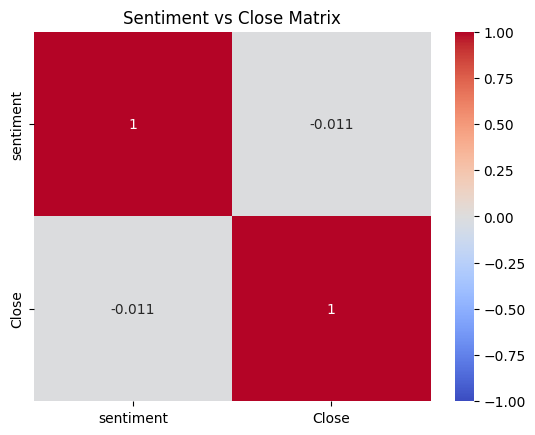

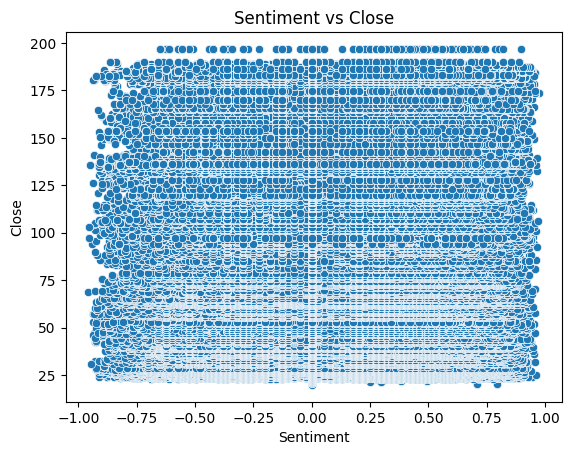

In [69]:
co.analyze_correlation_and_plot(aligned_date_MSFT, returns_col='Close')

Correlation between sentiment and daily stock returns: -0.011810888801560145


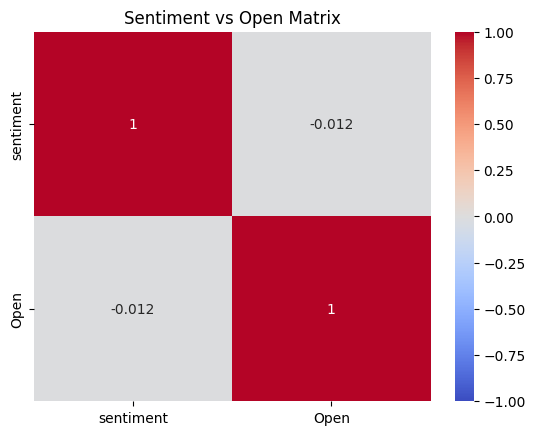

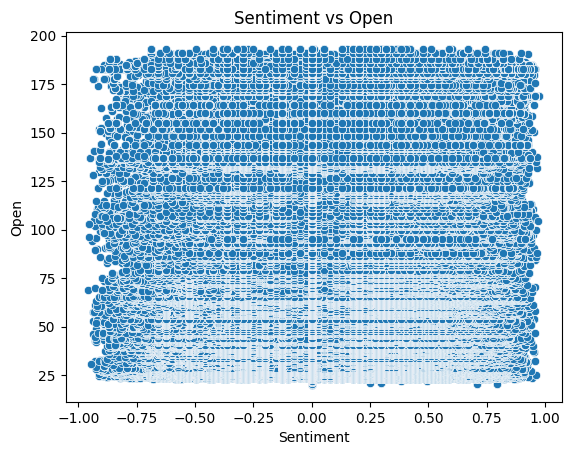

In [70]:
co.analyze_correlation_and_plot(aligned_date_MSFT, returns_col='Open')

Correlation between sentiment and daily stock returns: -0.012619243207876702


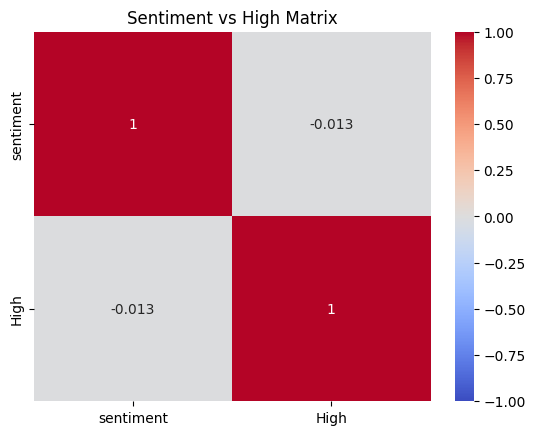

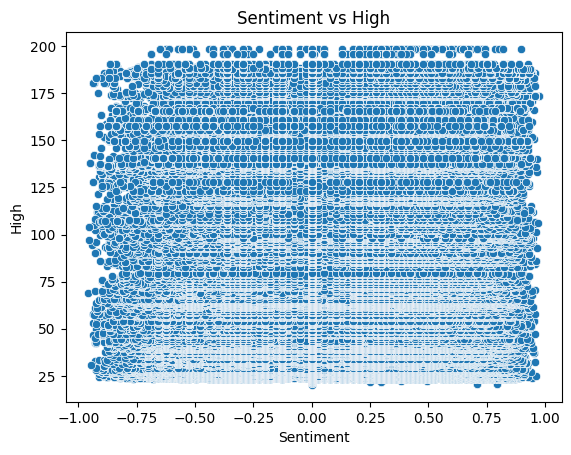

In [71]:
co.analyze_correlation_and_plot(aligned_date_MSFT, returns_col='High')

Correlation between sentiment and daily stock returns: -0.010864471945896407


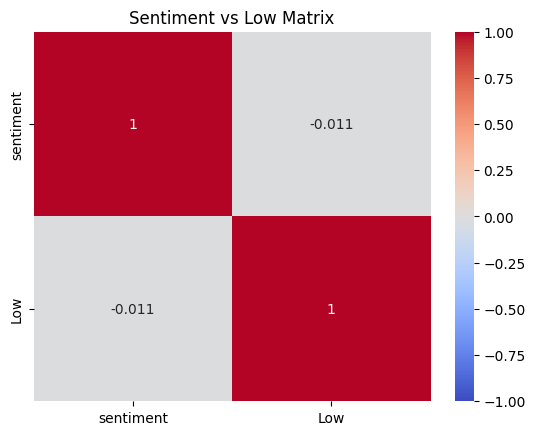

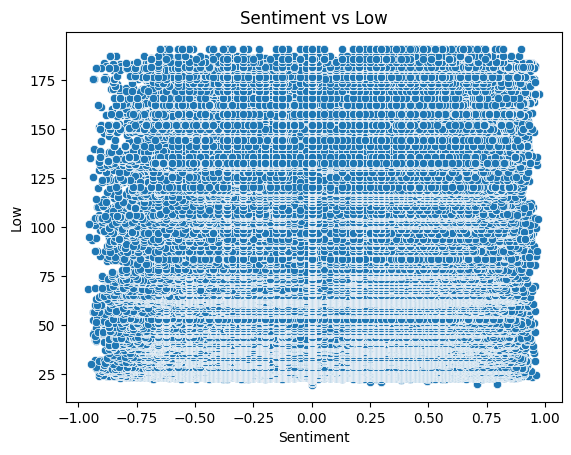

In [72]:
co.analyze_correlation_and_plot(aligned_date_MSFT, returns_col='Low')

Correlation between sentiment and daily stock returns: -0.011280551340012004


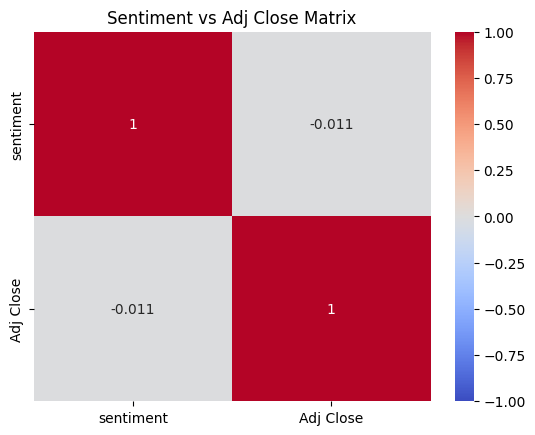

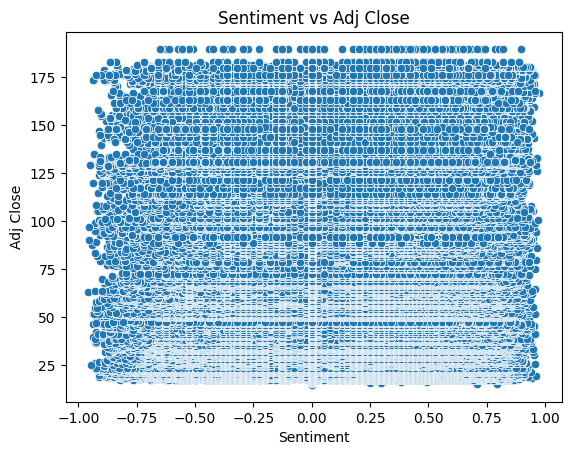

In [73]:
co.analyze_correlation_and_plot(aligned_date_MSFT, returns_col='Adj Close')

## NVDA

In [74]:
df_NVDA = co.read_csv_with_date(filepath=file_paths['NVDA'], date_col='Date')

In [75]:
co.check_nulls_and_info(df_NVDA, 'NVDA Data')

Total null values in NVDA Data: 0

NVDA Data Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6421 entries, 0 to 6420
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Date          6421 non-null   datetime64[ns]
 1   Open          6421 non-null   float64       
 2   High          6421 non-null   float64       
 3   Low           6421 non-null   float64       
 4   Close         6421 non-null   float64       
 5   Adj Close     6421 non-null   float64       
 6   Volume        6421 non-null   int64         
 7   Dividends     6421 non-null   float64       
 8   Stock Splits  6421 non-null   float64       
dtypes: datetime64[ns](1), float64(7), int64(1)
memory usage: 451.6 KB
None




In [76]:
df_NVDA = co.convert_to_datetime(df_NVDA, date_col='Date')
df_NVDA.head(3)

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
0,1999-01-22 00:00:00+00:00,0.043750,0.048828,0.038802,0.041016,0.037621,2714688000,0.0,0.0
1,1999-01-25 00:00:00+00:00,0.044271,0.045833,0.041016,0.045313,0.041562,510480000,0.0,0.0
2,1999-01-26 00:00:00+00:00,0.045833,0.046745,0.041146,0.041797,0.038337,343200000,0.0,0.0


In [77]:
df_NVDA = co.format_date_column(df_NVDA, date_col='Date')
df_NVDA.head(3)

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
0,1999-01-22,0.043750,0.048828,0.038802,0.041016,0.037621,2714688000,0.0,0.0
1,1999-01-25,0.044271,0.045833,0.041016,0.045313,0.041562,510480000,0.0,0.0
2,1999-01-26,0.045833,0.046745,0.041146,0.041797,0.038337,343200000,0.0,0.0


In [78]:
df_NVDA.rename(columns={"Date": "date"}, inplace=True)
df_NVDA.set_index('date', inplace=True)
df_NVDA.sample(5)

,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
date,,,,,,,,
2023-03-24,27.031000,27.167000,26.355000,26.778999,26.768215,454920000,0.0,0.0
2016-12-16,2.495750,2.517500,2.443250,2.510250,2.473862,1089528000,0.0,0.0
2002-05-06,0.265833,0.278333,0.260333,0.262500,0.240772,1102044000,0.0,0.0
2003-02-14,0.093500,0.100417,0.091250,0.100333,0.092028,3548844000,0.0,0.0
1999-12-27,0.098698,0.098828,0.091927,0.092969,0.085274,202416000,0.0,0.0


In [79]:
df_NVDA = co.calculate_daily_returns(df_NVDA)

In [104]:
aligned_date_NVDA = co.merge_dataframes(df_NVDA, sentiment_data)
aligned_date_NVDA

,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits,Daily Returns,Unnamed: 0,headline,url,publisher,stock,sentiment,sentiment_category
date,,,,,,,,,,,,,,,,
2009-04-27,0.28200,0.29000,0.27375,0.27550,0.252696,787024000,0.0,0.0,-0.035871,522587,Update on the Luxury Sector: 2nd Quarter 2009,https://www.benzinga.com/charles-lewis-sizemor...,Charles Lewis Sizemore CFA,FT,0.0000,Neutral
2009-04-27,0.28200,0.29000,0.27375,0.27550,0.252696,787024000,0.0,0.0,-0.035871,1396488,Update on the Luxury Sector: 2nd Quarter 2009,https://www.benzinga.com/charles-lewis-sizemor...,Charles Lewis Sizemore CFA,Y,0.0000,Neutral
2009-04-29,0.27750,0.27875,0.26875,0.27200,0.249486,859668000,0.0,0.0,-0.015385,1834,Going Against the Herd,https://www.benzinga.com/charles-lewis-sizemor...,Charles Lewis Sizemore CFA,A,0.0000,Neutral
2009-05-22,0.24175,0.24900,0.23725,0.24550,0.225179,718260000,0.0,0.0,0.015512,68387,Charles Sizemore Radio Interview Saturday Morning,https://www.benzinga.com/11218/charles-sizemor...,Charles Lewis Sizemore CFA,AM,0.0000,Neutral
2009-05-27,0.25750,0.26700,0.25500,0.25925,0.237791,814152000,0.0,0.0,0.001932,430147,MRM a $15-$20+ stock - FIT new information - J...,https://www.benzinga.com/superman/2009/5/27/mr...,superman,EPS,0.7925,Very Positive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-06-11,9.15000,9.26125,8.78600,8.79625,8.770122,583652000,0.0,0.0,-0.060907,1402389,"Shares of several hotels, restaurants & leisur...",https://www.benzinga.com/wiim/20/06/16233044/s...,Benzinga Newsdesk,YUM,0.3182,Positive
2020-06-11,9.15000,9.26125,8.78600,8.79625,8.770122,583652000,0.0,0.0,-0.060907,1402390,Morgan Stanley Maintains Overweight on Yum Bra...,https://www.benzinga.com/news/20/06/16231689/m...,Benzinga Newsdesk,YUM,-0.3612,Negative
2020-06-11,9.15000,9.26125,8.78600,8.79625,8.770122,583652000,0.0,0.0,-0.060907,1402391,"Credit Suisse Maintains Neutral on Yum Brands,...",https://www.benzinga.com/news/20/06/16231164/c...,Benzinga Newsdesk,YUM,0.3818,Positive


In [81]:
daily_sentiment_NVDA = co.aggregate_daily_sentiment(aligned_date_NVDA)

Correlation between sentiment and daily stock returns: -0.0011797629301171274


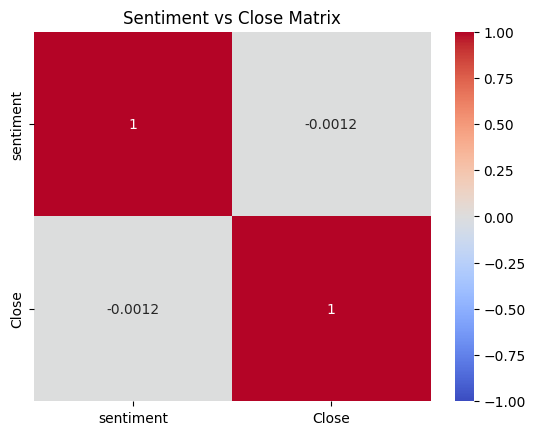

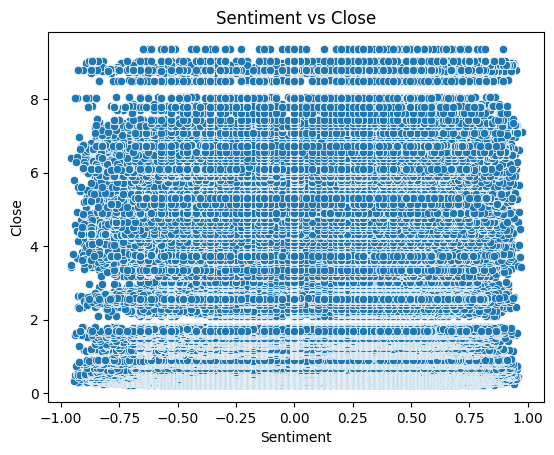

In [82]:
co.analyze_correlation_and_plot(aligned_date_NVDA, returns_col='Close')

Correlation between sentiment and daily stock returns: -0.0013907577341137946


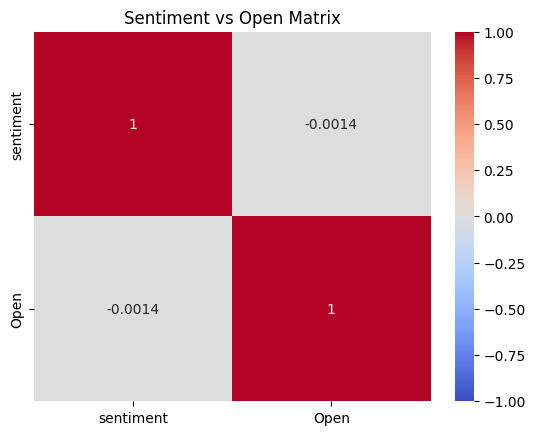

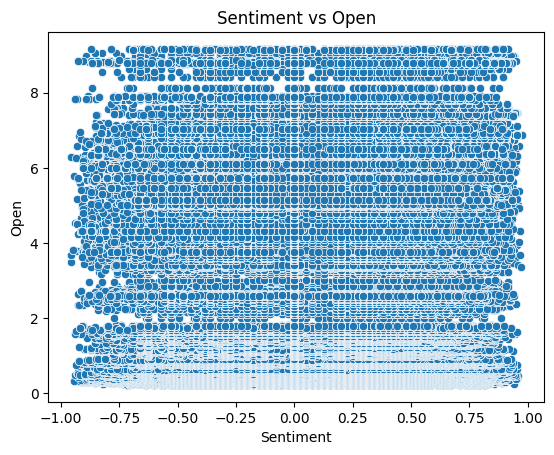

In [83]:
co.analyze_correlation_and_plot(aligned_date_NVDA, returns_col='Open')

Correlation between sentiment and daily stock returns: -0.002137303857477833


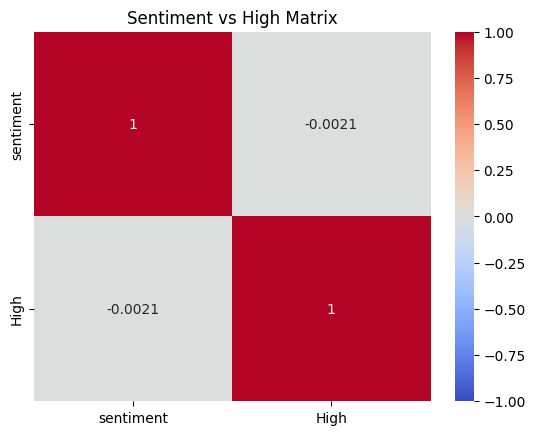

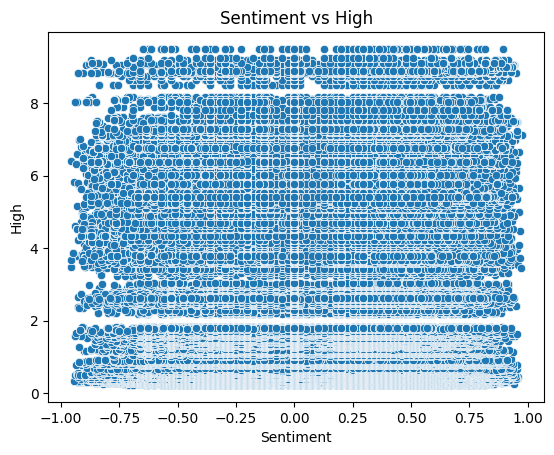

In [84]:
co.analyze_correlation_and_plot(aligned_date_NVDA, returns_col='High')

Correlation between sentiment and daily stock returns: -0.0006617213961166032


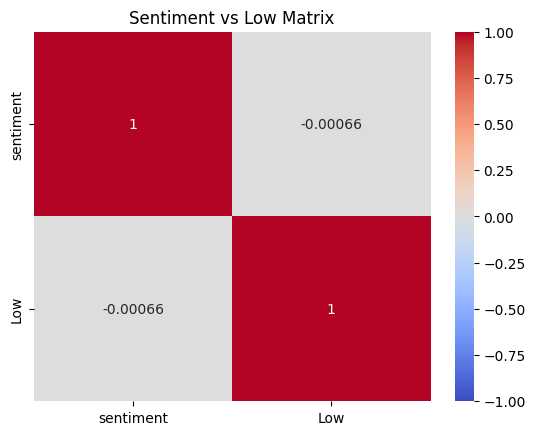

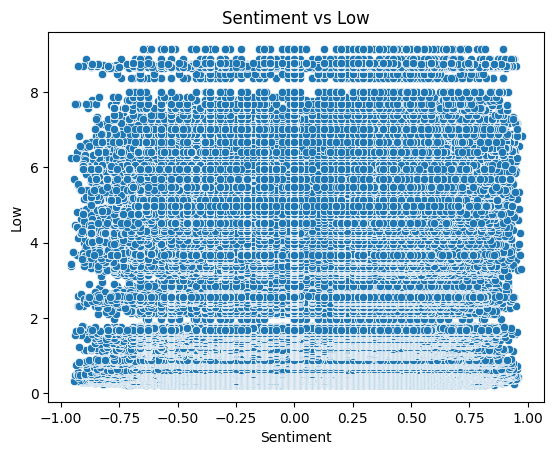

In [85]:
co.analyze_correlation_and_plot(aligned_date_NVDA, returns_col='Low')

Correlation between sentiment and daily stock returns: -0.001227680043885064


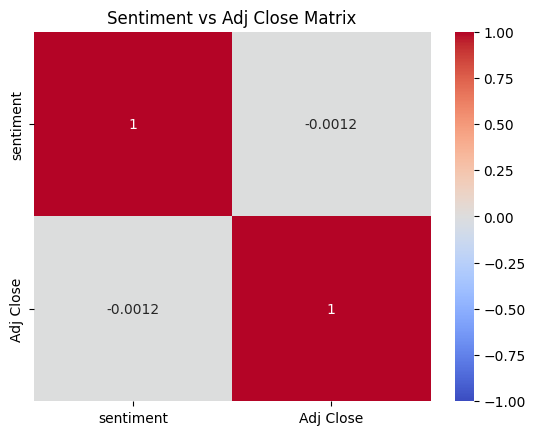

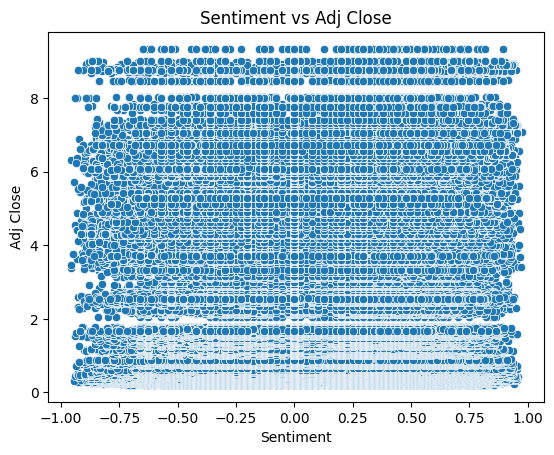

In [86]:
co.analyze_correlation_and_plot(aligned_date_NVDA, returns_col='Adj Close')

## TSLA

In [90]:
df_TSLA = co.read_csv_with_date(filepath=file_paths['TSLA'], date_col='Date')

In [91]:
co.check_nulls_and_info(df_TSLA, 'TSLA Data')

Total null values in TSLA Data: 0

TSLA Data Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6421 entries, 0 to 6420
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Date          6421 non-null   datetime64[ns]
 1   Open          6421 non-null   float64       
 2   High          6421 non-null   float64       
 3   Low           6421 non-null   float64       
 4   Close         6421 non-null   float64       
 5   Adj Close     6421 non-null   float64       
 6   Volume        6421 non-null   int64         
 7   Dividends     6421 non-null   float64       
 8   Stock Splits  6421 non-null   float64       
dtypes: datetime64[ns](1), float64(7), int64(1)
memory usage: 451.6 KB
None




In [92]:
df_TSLA = co.convert_to_datetime(df_TSLA, date_col='Date')
df_TSLA.head(3)

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
0,1999-01-22 00:00:00+00:00,0.043750,0.048828,0.038802,0.041016,0.037621,2714688000,0.0,0.0
1,1999-01-25 00:00:00+00:00,0.044271,0.045833,0.041016,0.045313,0.041562,510480000,0.0,0.0
2,1999-01-26 00:00:00+00:00,0.045833,0.046745,0.041146,0.041797,0.038337,343200000,0.0,0.0


In [93]:
df_TSLA = co.format_date_column(df_TSLA, date_col='Date')
df_TSLA.head(3)

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
0,1999-01-22,0.043750,0.048828,0.038802,0.041016,0.037621,2714688000,0.0,0.0
1,1999-01-25,0.044271,0.045833,0.041016,0.045313,0.041562,510480000,0.0,0.0
2,1999-01-26,0.045833,0.046745,0.041146,0.041797,0.038337,343200000,0.0,0.0


In [94]:
df_TSLA.rename(columns={"Date": "date"}, inplace=True)
df_TSLA.set_index('date', inplace=True)
df_TSLA.sample(5)

,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
date,,,,,,,,
2013-04-15,0.326250,0.327250,0.318500,0.320500,0.297683,430420000,0.0,0.0
2002-03-07,0.482250,0.483833,0.458500,0.471667,0.432626,1346532000,0.0,0.0
2024-06-14,129.960007,132.839996,128.320007,131.880005,131.880005,309320400,0.0,0.0
1999-04-26,0.035938,0.036458,0.033333,0.034115,0.031291,123504000,0.0,0.0
1999-11-29,0.079427,0.080469,0.075000,0.076823,0.070464,298608000,0.0,0.0


In [95]:
df_TSLA = co.calculate_daily_returns(df_TSLA)

In [106]:
aligned_date_TSLA = co.merge_dataframes(df_TSLA, sentiment_data)



In [97]:
daily_sentiment_TSLA = co.aggregate_daily_sentiment(aligned_date_TSLA)

Correlation between sentiment and daily stock returns: -0.0011797629301171274


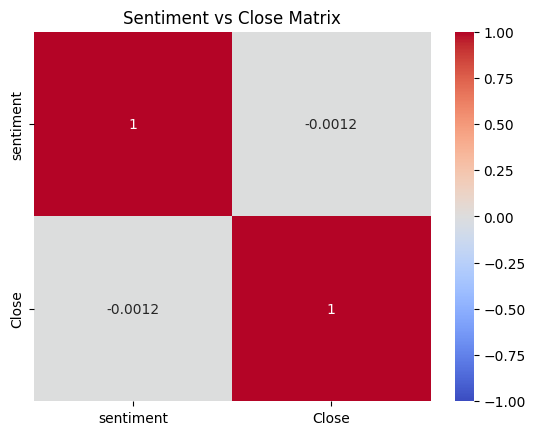

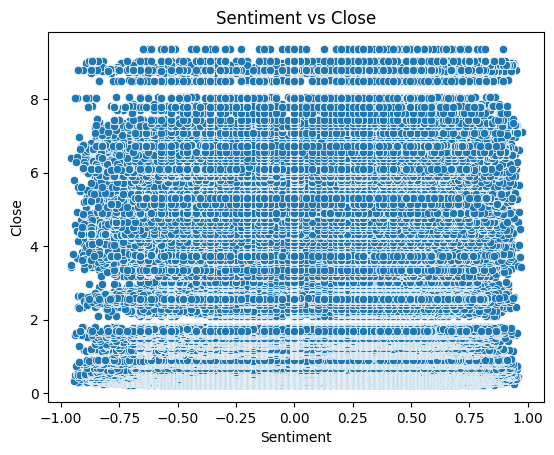

In [98]:
co.analyze_correlation_and_plot(aligned_date_TSLA, returns_col='Close')

Correlation between sentiment and daily stock returns: -0.0013907577341137946


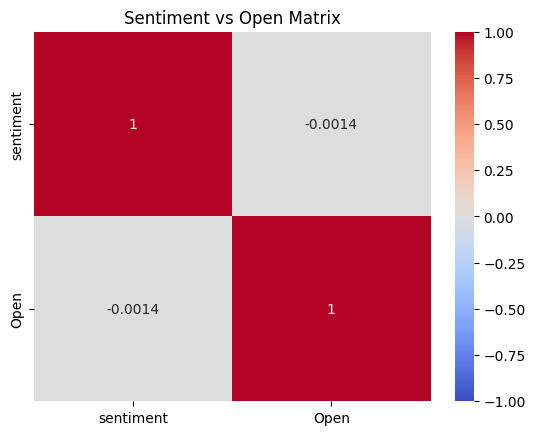

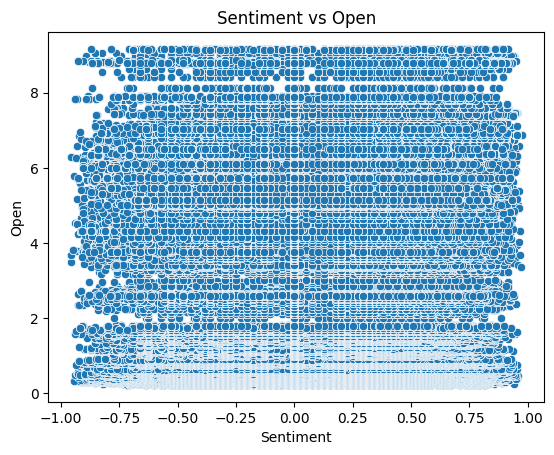

In [99]:
co.analyze_correlation_and_plot(aligned_date_TSLA, returns_col='Open')

Correlation between sentiment and daily stock returns: -0.002137303857477833


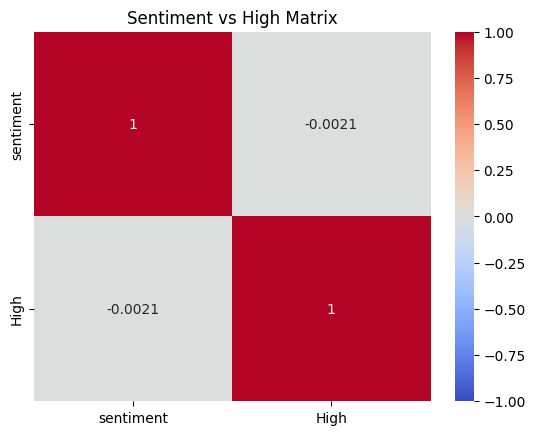

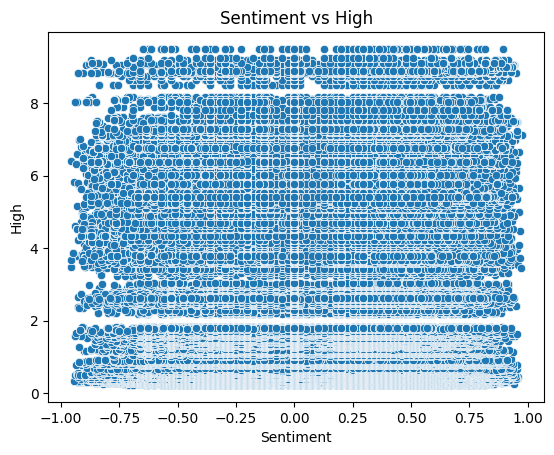

In [100]:
co.analyze_correlation_and_plot(aligned_date_TSLA, returns_col='High')

Correlation between sentiment and daily stock returns: -0.0006617213961166032


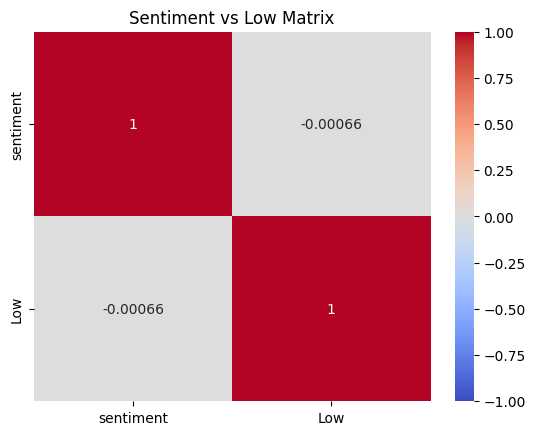

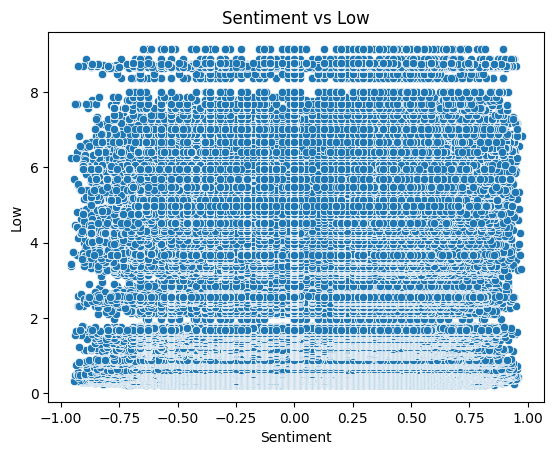

In [101]:
co.analyze_correlation_and_plot(aligned_date_TSLA, returns_col='Low')

Correlation between sentiment and daily stock returns: -0.001227680043885064


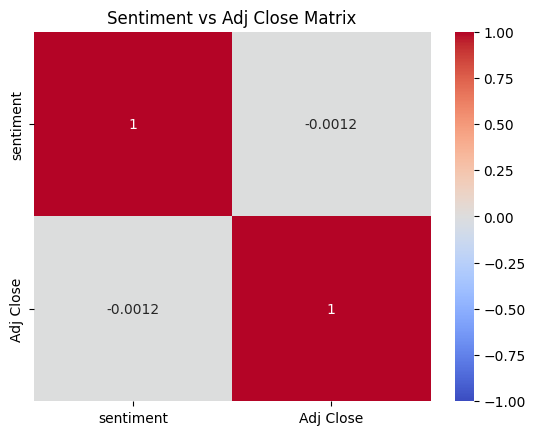

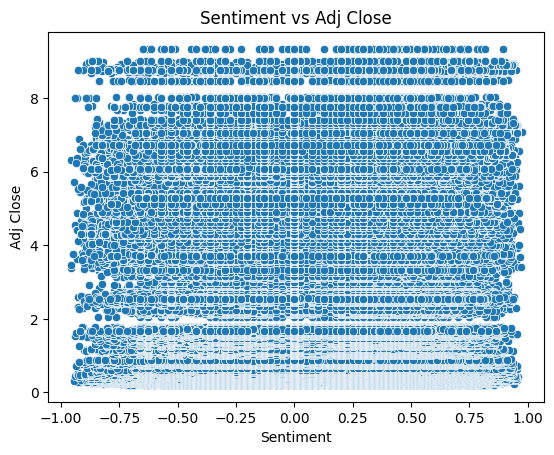

In [102]:
co.analyze_correlation_and_plot(aligned_date_TSLA, returns_col='Adj Close')